In [1]:
%%capture
# Install relevant libraries
# Installer les libraries indispensables
!pip install geopandas folium

![](http:/)

In [2]:
# Importer les libraries
import pandas as pd
import numpy as np
import random
import os
from tqdm.notebook import tqdm
import ast

import geopandas as gpd
from shapely.geometry import Point
from shapely.geometry import LineString
import folium

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
pd.options.display.float_format = '{:.5f}'.format
pd.options.display.max_rows = None
pd.options.display.max_columns = None
pd.options.display.max_colwidth = None

import random
from sklearn.model_selection import GroupKFold
import lightgbm as lgb
from tqdm import tqdm
%matplotlib inline
import warnings

warnings.filterwarnings('ignore')

In [3]:
SEED = 42
np.random.seed(SEED)
random.seed(SEED)
N_SPLITS = 5

# Load Data
train = pd.read_csv("/kaggle/input/mobility-predictions/Train_yango.csv")
test = pd.read_csv("/kaggle/input/mobility-predictions/Test_yango.csv")
definitions_des_variables = pd.read_csv("/kaggle/input/mobility-predictions/VariableDefinitions.csv")
definitions_des_variables.head()
samplesubmission = pd.read_csv('/kaggle/input/mobility-predictions/SampleSubmission_Yango.csv')



graph_df = pd.read_csv("/kaggle/input/mobility-predictions/Graph.csv")
samplesubmission.shape


(13665, 2)

In [4]:
train.head()

,ID,persistent_id,day,prediction_type,count_norm_00_0_,count_norm_00_1_,count_norm_00_2_,count_norm_00_3_,count_norm_01_0_,count_norm_01_1_,count_norm_01_2_,count_norm_01_3_,count_norm_02_0_,count_norm_02_1_,count_norm_02_2_,count_norm_02_3_,count_norm_03_0_,count_norm_03_1_,count_norm_03_2_,count_norm_03_3_,count_norm_04_0_,count_norm_04_1_,count_norm_04_2_,count_norm_04_3_,count_norm_05_0_,count_norm_05_1_,count_norm_07_2_,count_norm_07_3_,count_norm_08_0_,count_norm_08_1_,count_norm_08_2_,count_norm_08_3_,count_norm_09_0_,count_norm_09_1_,count_norm_09_2_,count_norm_09_3_,count_norm_10_0_,count_norm_10_1_,count_norm_10_2_,count_norm_10_3_,count_norm_11_0_,count_norm_11_1_,count_norm_11_2_,count_norm_11_3_,count_norm_12_0_,count_norm_12_1_,count_norm_12_2_,count_norm_12_3_,count_norm_13_0_,count_norm_13_1_,count_norm_13_2_,count_norm_13_3_,count_norm_14_0_,count_norm_14_1_,count_norm_14_2_,count_norm_14_3_,count_norm_15_0_,count_norm_15_1_,count_norm_15_2_,count_norm_15_3_,count_norm_16_0_,count_norm_16_1_,count_norm_16_2_,count_norm_16_3_,count_norm_17_0_,count_norm_17_1_,count_norm_19_2_,count_norm_19_3_,count_norm_20_0_,count_norm_20_1_,count_norm_20_2_,count_norm_20_3_,count_norm_21_0_,count_norm_21_1_,count_norm_21_2_,count_norm_21_3_,count_norm_22_0_,count_norm_22_1_,count_norm_22_2_,count_norm_22_3_,count_norm_23_0_,count_norm_23_1_,count_norm_23_2_,count_norm_23_3_,speed_avg_00_0_,speed_avg_00_1_,speed_avg_00_2_,speed_avg_00_3_,speed_avg_01_0_,speed_avg_01_1_,speed_avg_01_2_,speed_avg_01_3_,speed_avg_02_0_,speed_avg_02_1_,speed_avg_02_2_,speed_avg_02_3_,speed_avg_03_0_,speed_avg_03_1_,speed_avg_03_2_,speed_avg_03_3_,speed_avg_04_0_,speed_avg_04_1_,speed_avg_04_2_,speed_avg_04_3_,speed_avg_05_0_,speed_avg_05_1_,speed_avg_07_2_,speed_avg_07_3_,speed_avg_08_0_,speed_avg_08_1_,speed_avg_08_2_,speed_avg_08_3_,speed_avg_09_0_,speed_avg_09_1_,speed_avg_09_2_,speed_avg_09_3_,speed_avg_10_0_,speed_avg_10_1_,speed_avg_10_2_,speed_avg_10_3_,speed_avg_11_0_,speed_avg_11_1_,speed_avg_11_2_,speed_avg_11_3_,speed_avg_12_0_,speed_avg_12_1_,speed_avg_12_2_,speed_avg_12_3_,speed_avg_13_0_,speed_avg_13_1_,speed_avg_13_2_,speed_avg_13_3_,speed_avg_14_0_,speed_avg_14_1_,speed_avg_14_2_,speed_avg_14_3_,speed_avg_15_0_,speed_avg_15_1_,speed_avg_15_2_,speed_avg_15_3_,speed_avg_16_0_,speed_avg_16_1_,speed_avg_16_2_,speed_avg_16_3_,speed_avg_17_0_,speed_avg_17_1_,speed_avg_19_2_,speed_avg_19_3_,speed_avg_20_0_,speed_avg_20_1_,speed_avg_20_2_,speed_avg_20_3_,speed_avg_21_0_,speed_avg_21_1_,speed_avg_21_2_,speed_avg_21_3_,speed_avg_22_0_,speed_avg_22_1_,speed_avg_22_2_,speed_avg_22_3_,speed_avg_23_0_,speed_avg_23_1_,speed_avg_23_2_,speed_avg_23_3_,target
0,ID_2351954248757948416_X_first_weekday_X_morning_rush_hour,2351954248757948416.00000,first_weekday,morning_rush_hour,0.00020,0.00014,0.00016,0.00011,0.00012,0.00016,0.00010,0.00010,0.00012,0.00005,0.00007,0.00006,0.00006,0.00004,0.00010,0.00004,0.00007,0.00008,0.00005,0.00005,0.00006,0.00006,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.19002,10.77018,11.34794,10.95035,9.83483,10.98692,12.57882,11.95044,12.53321,12.19226,12.72185,12.50796,11.34267,11.36678,12.49785,13.10805,13.50197,12.47343,13.82490,14.43391,13.87354,12.02646,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.25063
1,ID_5437942435945244672_X_last_weekday_X_morning_rush_hour,5437942435945244672.00000,last_weekday,morning_rush_hour,0.00006,0.00010,0.00005,0.00011,0.00009,0.00006,0.00004,0.00007,0.00003,0.00002,0.00004,0.00002,0.00002,0.00003,NaN,0.00001,0.00002,0.00001,0.00003,0.00002,0.00003,0.00003,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Na

In [5]:
test.head()


,ID,persistent_id,day,prediction_type,count_norm_00_0_,count_norm_00_1_,count_norm_00_2_,count_norm_00_3_,count_norm_01_0_,count_norm_01_1_,count_norm_01_2_,count_norm_01_3_,count_norm_02_0_,count_norm_02_1_,count_norm_02_2_,count_norm_02_3_,count_norm_03_0_,count_norm_03_1_,count_norm_03_2_,count_norm_03_3_,count_norm_04_0_,count_norm_04_1_,count_norm_04_2_,count_norm_04_3_,count_norm_05_0_,count_norm_05_1_,count_norm_07_2_,count_norm_07_3_,count_norm_08_0_,count_norm_08_1_,count_norm_08_2_,count_norm_08_3_,count_norm_09_0_,count_norm_09_1_,count_norm_09_2_,count_norm_09_3_,count_norm_10_0_,count_norm_10_1_,count_norm_10_2_,count_norm_10_3_,count_norm_11_0_,count_norm_11_1_,count_norm_11_2_,count_norm_11_3_,count_norm_12_0_,count_norm_12_1_,count_norm_12_2_,count_norm_12_3_,count_norm_13_0_,count_norm_13_1_,count_norm_13_2_,count_norm_13_3_,count_norm_14_0_,count_norm_14_1_,count_norm_14_2_,count_norm_14_3_,count_norm_15_0_,count_norm_15_1_,count_norm_15_2_,count_norm_15_3_,count_norm_16_0_,count_norm_16_1_,count_norm_16_2_,count_norm_16_3_,count_norm_17_0_,count_norm_17_1_,count_norm_19_2_,count_norm_19_3_,count_norm_20_0_,count_norm_20_1_,count_norm_20_2_,count_norm_20_3_,count_norm_21_0_,count_norm_21_1_,count_norm_21_2_,count_norm_21_3_,count_norm_22_0_,count_norm_22_1_,count_norm_22_2_,count_norm_22_3_,count_norm_23_0_,count_norm_23_1_,count_norm_23_2_,count_norm_23_3_,speed_avg_00_0_,speed_avg_00_1_,speed_avg_00_2_,speed_avg_00_3_,speed_avg_01_0_,speed_avg_01_1_,speed_avg_01_2_,speed_avg_01_3_,speed_avg_02_0_,speed_avg_02_1_,speed_avg_02_2_,speed_avg_02_3_,speed_avg_03_0_,speed_avg_03_1_,speed_avg_03_2_,speed_avg_03_3_,speed_avg_04_0_,speed_avg_04_1_,speed_avg_04_2_,speed_avg_04_3_,speed_avg_05_0_,speed_avg_05_1_,speed_avg_07_2_,speed_avg_07_3_,speed_avg_08_0_,speed_avg_08_1_,speed_avg_08_2_,speed_avg_08_3_,speed_avg_09_0_,speed_avg_09_1_,speed_avg_09_2_,speed_avg_09_3_,speed_avg_10_0_,speed_avg_10_1_,speed_avg_10_2_,speed_avg_10_3_,speed_avg_11_0_,speed_avg_11_1_,speed_avg_11_2_,speed_avg_11_3_,speed_avg_12_0_,speed_avg_12_1_,speed_avg_12_2_,speed_avg_12_3_,speed_avg_13_0_,speed_avg_13_1_,speed_avg_13_2_,speed_avg_13_3_,speed_avg_14_0_,speed_avg_14_1_,speed_avg_14_2_,speed_avg_14_3_,speed_avg_15_0_,speed_avg_15_1_,speed_avg_15_2_,speed_avg_15_3_,speed_avg_16_0_,speed_avg_16_1_,speed_avg_16_2_,speed_avg_16_3_,speed_avg_17_0_,speed_avg_17_1_,speed_avg_19_2_,speed_avg_19_3_,speed_avg_20_0_,speed_avg_20_1_,speed_avg_20_2_,speed_avg_20_3_,speed_avg_21_0_,speed_avg_21_1_,speed_avg_21_2_,speed_avg_21_3_,speed_avg_22_0_,speed_avg_22_1_,speed_avg_22_2_,speed_avg_22_3_,speed_avg_23_0_,speed_avg_23_1_,speed_avg_23_2_,speed_avg_23_3_
0,ID_12774757194929362944_X_other_weekday_X_evening_rush_hour,12774757194929364992.00000,other_weekday,evening_rush_hour,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00008,0.00014,0.00017,0.00012,0.00016,0.00018,0.00019,0.00013,0.00020,0.00026,0.00023,0.00022,0.00020,0.00020,0.00026,0.00023,0.00018,0.00023,0.00028,0.00026,0.00025,0.00026,0.00032,0.00024,0.00024,0.00029,0.00024,0.00026,0.00025,0.00026,0.00030,0.00031,0.00030,0.00029,0.00028,0.00026,0.00033,0.00027,0.00035,0.00024,0.00029,0.00026,0.00034,0.00031,0.00034,0.00028,0.00028,0.00029,0.00030,0.00030,0.00024,0.00032,0.00033,0.00031,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.42267,10.34818,10.15642,9.58697,10.61720,10.02152,10.00615,10.47221,10.31264,10.42596,10.28249,10.29682,10.97359,10.44395,10.05816,10.88969,9.83944,10.70340,9.90443,10.77225,11.14578,10.96132,10.82798,10.44902,10.60871,10.75286,10.83361,11.22216,11.10347,11.12579,10.59742,10.73051,10.22235,10.99010,10.87762,10.80848,10.85109,10.59912,11.04110,10.79766,9.35070,10.17085,9.37098,10.01042,10.18394,9.55097,9.56613,10.28838,10.34845,10.56812,10.52144,11.54661,10.62756,11.10359,NaN,NaN,NaN,NaN
1,ID_17452592308638134272_X_second_weekday_X_evening_rush_hour,17452592308638134272

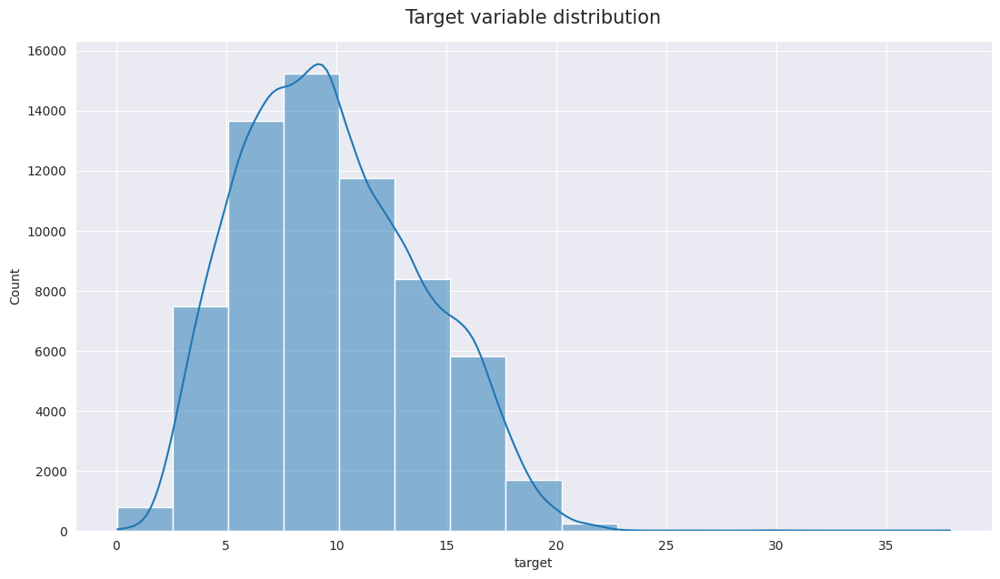

None

0.3561755330971113

In [6]:
# Target variable distribution
# Distribution de la valeur cible
sns.set_style('darkgrid')
plt.figure(figsize = (13, 7))
sns.histplot(train.target, kde = True, bins = 15)
plt.title('Target variable distribution', y = 1.02, fontsize = 15)
display(plt.show(), train.target.skew())

In [7]:
# Create a geopandas df
# convert the geometry column to a tuple

# Créer un geopandas dataframe
# Convertir la colonne 'geometry' en tuple
#graph_df.geometry = graph_df.geometry.apply(lambda x: ast.literal_eval(x.replace(';', ',').replace('[', '(').replace(']', ')')))
graph_df.geometry = graph_df.geometry.apply(lambda x: ast.literal_eval(x.replace(';', ',').replace('[', '(').replace(']', ')')) if isinstance(x, str) else x)
# Create LineString objects from the tuples of coordinates
# Créer des objects LineString à partir des coordonnées des tuples
lines = [LineString(coords) for coords in graph_df['geometry']]

# Create a GeoDataFrame with LineString geometry
# Créer un GeoDataFrame avec LineString
gdf = gpd.GeoDataFrame(graph_df, geometry=lines)

# Preview
# Examiner les 2 premieres lignes
gdf.head(2)

# Create a Folium map centered at a specific location
# Créer une carte Folium centrée sur un emplacement spécifique
map_center = [gdf.geometry.centroid.y.mean(), gdf.geometry.centroid.x.mean()]
mymap = folium.Map(location=map_center, zoom_start=11)

# Iterate through the GeoDataFrame and add LineString objects to the map
# Parcourez le GeoDataFrame et ajoutez des objets LineString à la carte
for idx, row in gdf.iterrows():
    folium.GeoJson(row['geometry']).add_to(mymap)

# Display the map
# Montrer la carte
mymap

In [8]:
train_copy = train[['persistent_id', 'target']]
train_copy ['dataset'] = 'train'
test_copy = test[['persistent_id']]
test_copy ['dataset'] = 'test'
train_test = pd.concat([train_copy, test_copy])
new_gdf = gdf.merge(train_test[['persistent_id', 'target', 'dataset']], how = 'left', on = ['persistent_id'])
new_gdf.head(2)
# Preview roads in train
# Examiner quelques routes dans le train dataset
new_gdf.toponym.value_counts(normalize = True).head()

# Visualise Boulevard Road
# Visualiser les routes avec boulevard
Boulevard = new_gdf[new_gdf.toponym == 'Boulevard Latrille']

# Create a Folium map centered at a specific location
# Créer une carte Folium centrée sur un emplacement spécifique
map_center = [Boulevard.geometry.centroid.y.mean(), Boulevard.geometry.centroid.x.mean()]
mymap = folium.Map(location=map_center, zoom_start=20)

# Iterate through the GeoDataFrame and add LineString objects to the map
# Parcourez le GeoDataFrame et ajoutez des objets LineString à la carte
for idx, row in Boulevard.iterrows():
    folium.GeoJson(row['geometry'], style_function=lambda feature: {'weight': 5}).add_to(mymap)

# Display the map
# Montrer la carte
mymap

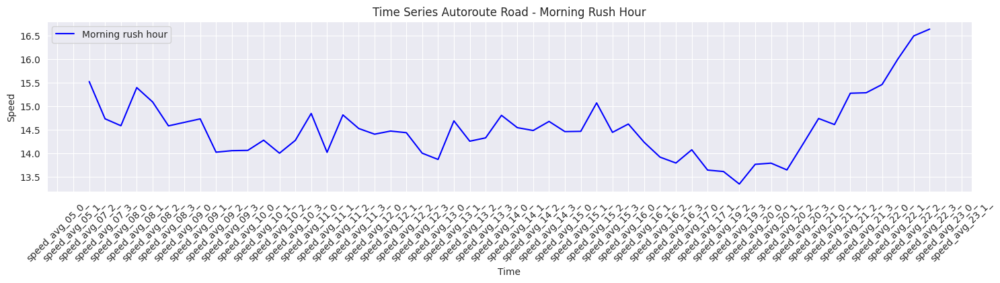

In [10]:
train_graph = train.merge(graph_df, how = 'left', on = 'persistent_id')
Autoroute_road = train_graph[train_graph.toponym == "Autoroute d'Abobo"]

Autoroute = Autoroute_road[Autoroute_road.day == 'other_holiday'][[x for x in Autoroute_road.columns if x.startswith('speed_avg')]].T.reset_index().iloc[:, :3]
Autoroute.columns = ['time', 'morning_rush', 'evening_rush']
Autoroute

plt.figure(figsize=(15, 7))

plt.subplot(2, 1, 1)
plt.plot(Autoroute['time'], Autoroute['morning_rush'], color='blue', label='Morning rush hour')
plt.xlabel('Time')
plt.ylabel('Speed')
plt.title('Time Series Autoroute Road - Morning Rush Hour')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)


plt.tight_layout()

# Show the plot
# Montrer le graph
plt.show()

In [11]:
# Preview roads in train
# Examiner quelques routes dans le train dataset
new_gdf.toponym.value_counts(normalize = True).head()

toponym
Boulevard Latrille                 0.05524
Boulevard Phillipe Grégoire Yacé   0.04954
Autoroute du Nord                  0.03980
Avenue Fologo Laurent Dona         0.03873
Boulevard du Port                  0.03667
Name: proportion, dtype: float64

In [12]:
# Visualise Boulevard Road
# Visualiser les routes avec boulevard
Boulevard = new_gdf[new_gdf.toponym == 'Boulevard Latrille']

# Create a Folium map centered at a specific location
# Créer une carte Folium centrée sur un emplacement spécifique
map_center = [Boulevard.geometry.centroid.y.mean(), Boulevard.geometry.centroid.x.mean()]
mymap = folium.Map(location=map_center, zoom_start=20)

# Iterate through the GeoDataFrame and add LineString objects to the map
# Parcourez le GeoDataFrame et ajoutez des objets LineString à la carte
for idx, row in Boulevard.iterrows():
    folium.GeoJson(row['geometry'], style_function=lambda feature: {'weight': 5}).add_to(mymap)

# Display the map
# Montrer la carte
mymap

# 1. Prétraitement des Données :

Nettoyage et Gestion des Valeurs Manquantes
Le traitement des valeurs manquantes est essentiel pour garantir que notre modèle ne soit pas perturbé par des données incomplètes. Ce nettoyage est effectué de manière méthodique en supprimant les colonnes contenant des valeurs manquantes à 100 % et en remplissant les autres valeurs manquantes avec -1.

In [13]:
# Suppression des colonnes entièrement manquantes
train.dropna(axis=1, how='all', inplace=True)
test.dropna(axis=1, how='all', inplace=True)

# Remplacement des valeurs manquantes restantes par -1
train.fillna(-1, inplace=True)
test.fillna(-1, inplace=True)


# 2. Feature Engineering : Capturer les Tendances et Modéliser le Comportement du Trafic


* Le feature engineering est une étape cruciale pour optimiser la prédiction des modèles en ajoutant des caractéristiques agrégées et des caractéristiques de retard qui capturent les tendances du trafic dans la ville.
* Lag Features : Ces caractéristiques mesurent la différence ou le ratio entre des valeurs de mesures récentes et plus anciennes. Elles sont cruciales pour capturer la dynamique temporelle, comme l'impact de l'heure de la journée ou des événements sur la circulation.
* GroupKFold assure que les données sont réparties en groupes similaires, ce qui est essentiel pour garantir une évaluation juste et robuste du modèle, notamment dans un environnement avec des données réparties de manière non homogène, comme c'est le cas pour les zones géographiques de Abidjan.


In [14]:
# Features and Target
features = train.columns.difference(['ID', 'persistent_id', 'day', 'prediction_type', 'target', 'dataset']).tolist()
X = train[features]
y = train['target']
test_features = test[features]

# Groupes pour Stratified GroupKFold (basé sur 'persistent_id')
groups = train['persistent_id']

# Caractéristiques agrégées (mean, std, min, max, etc.) pour l'entrainement
train_num_agg = train.groupby("persistent_id")[features].agg(['first', 'mean', 'std', 'min', 'max', 'last'])
train_num_agg.columns = ['_'.join(x) for x in train_num_agg.columns]
train_num_agg.reset_index(inplace=True)

# Caractéristiques de retard pour le train
lag_features = {}
for col in tqdm(train_num_agg.columns, desc="Creating lag features for train"):
    if 'last' in col and col.replace('last', 'first') in train_num_agg:
        lag_features[col + '_lag_sub'] = train_num_agg[col] - train_num_agg[col.replace('last', 'first')]
        lag_features[col + '_lag_div'] = train_num_agg[col] / train_num_agg[col.replace('last', 'first')]

# Fusionner les nouvelles caractéristiques de retard avec train_num_agg
lag_features_df = pd.DataFrame(lag_features)
train_num_agg = pd.concat([train_num_agg, lag_features_df], axis=1)

# Merge new features back to the train dataset
train = train.merge(train_num_agg, how='inner', on='persistent_id')

# Caractéristiques agrégées (mean, std, min, max, etc.) pour les donnees de test

test_num_agg = test.groupby("persistent_id")[features].agg(['first', 'mean', 'std', 'min', 'max', 'last'])
test_num_agg.columns = ['_'.join(x) for x in test_num_agg.columns]
test_num_agg.reset_index(inplace=True)

# Répéter le même processus pour le test
lag_features_test = {}
for col in tqdm(test_num_agg.columns, desc="Creating lag features for test"):
    if 'last' in col and col.replace('last', 'first') in test_num_agg:
        lag_features_test[col + '_lag_sub'] = test_num_agg[col] - test_num_agg[col.replace('last', 'first')]
        lag_features_test[col + '_lag_div'] = test_num_agg[col] / test_num_agg[col.replace('last', 'first')]

lag_features_test_df = pd.DataFrame(lag_features_test)
test_num_agg = pd.concat([test_num_agg, lag_features_test_df], axis=1)

# Fusionner les nouvelles caractéristiques de retard avec test_num_agg
test = test.merge(test_num_agg, how='inner', on='persistent_id')

X = train.drop(['ID', 'persistent_id', 'day', 'prediction_type', 'target'], axis=1)
y = train['target']
test_features = test.drop(['ID', 'persistent_id', 'day', 'prediction_type'], axis=1)



Creating lag features for test: 100%|██████████| 913/913 [00:00<00:00, 19852.35it/s]


# 3. LightGBM : Un Modèle d'Apprentissage Automatique Efficace pour la Prédiction du Trafic
LightGBM est un algorithme de boosting qui est particulièrement adapté pour les données de grande dimension et pour capturer les relations non linéaires, ce qui est essentiel pour modéliser le trafic complexe.

In [15]:
# Paramètres pour le modele LightGBM
params = {
    'device': 'gpu',
    'colsample_bytree': 0.6205127330130058,
    'learning_rate': 0.06932635188254582,
    'max_depth': 20,
    'min_child_samples': 10,
    'n_estimators': 2000,
    'num_leaves': 50,
    'reg_alpha': 0.9093204020787821,
    'reg_lambda': 0.2587799816000169,
    'subsample': 0.831261142176991
}

oof_predictions = np.zeros(len(train))
test_predictions = np.zeros(len(test_features))
fold_rmse_scores = []

# Perform GroupKFold Cross-Validation
gkf = GroupKFold(n_splits=N_SPLITS)
for fold, (train_idx, val_idx) in enumerate(gkf.split(X, y, groups)):
    print(f"\nTraining Fold {fold + 1}")
    
    # Train and Validation Split
    X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
    y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
    
    # LightGBM Dataset
    lgb_train = lgb.Dataset(X_train, y_train)
    lgb_val = lgb.Dataset(X_val, y_val, reference=lgb_train)
    
    # Train LightGBM Model with Best Parameters
    lightgbm_model = lgb.train(
        params,
        lgb_train,
        num_boost_round=params['n_estimators'],
        valid_sets=[lgb_train, lgb_val],
    )
    
    # Predict on Validation Set
    val_predictions = lightgbm_model.predict(X_val)
    oof_predictions[val_idx] = val_predictions
    fold_rmse = mean_squared_error(y_val, val_predictions, squared=False)
    fold_rmse_scores.append(fold_rmse)
    print(f"Fold {fold + 1} RMSE: {fold_rmse:.5f}")
    
    # Predict on Test Set
    test_predictions += lightgbm_model.predict(test_features) / N_SPLITS

# Overall RMSE
overall_rmse = mean_squared_error(y, oof_predictions, squared=False)
print(f"\nOverall RMSE: {overall_rmse:.5f}")


Training Fold 1
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 310080
[LightGBM] [Info] Number of data points in the train set: 51978, number of used features: 1216
[LightGBM] [Info] Using GPU Device: Tesla P100-PCIE-16GB, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...


1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.


[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 1216 dense feature groups (60.28 MB) transferred to GPU in 0.053302 secs. 0 sparse feature groups
[LightGBM] [Info] Start training from score 9.765158
Fold 1 RMSE: 0.72981

Training Fold 2
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 310080
[LightGBM] [Info] Number of data points in the train set: 51978, number of used features: 1216
[LightGBM] [Info] Using GPU Device: Tesla P100-PCIE-16GB, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 1216 dense feature groups (60.28 MB) transferred to GPU in 0.044247 secs. 0 sparse feature groups
[LightGBM] [Info] Start training from score 9.745302
Fold 2 RMSE: 0.75270

Training Fold 3
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 31

In [16]:
# Create Submission File
submission = pd.DataFrame({
    'ID': test['ID'],
    'target': test_predictions
})
submission.to_csv("optimized_mobility_predictions.csv", index=False)

print("Submission file created: LightGBM_Optimized_Submission.csv")


Submission file created: LightGBM_Optimized_Submission.csv


En intégrant ces étapes dans la solution de prédiction du trafic à Abidjan, nous créons un modèle robuste et précis, capable de gérer les spécificités locales de la ville. Le traitement des valeurs manquantes, l'ingénierie des caractéristiques temporelles et l'utilisation d'un modèle puissant comme LightGBM garantissent des prédictions fiables qui peuvent être utilisées pour améliorer la gestion du trafic à Abidjan.